Copyright 2021, Theorem Engine

This program is free software: you can redistribute it and/or modify it under the terms of the GNU General Public License as published by the Free Software Foundation, either version 3 of the License, or (at your option) any later version.

This program is distributed in the hope that it will be useful, but WITHOUT ANY WARRANTY; without even the implied warranty of MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the GNU General Public License for more details.

You should have received a copy of the GNU General Public License along with this program.  If not, see <https://www.gnu.org/licenses/>.

# <center> $(n, r)$ May-Leonard Models </center>

This notebook walks the user through a simple experiment using the $(3, 1)$ May-Leonard model for non-transitive
competition. The original non-spatial version of this model is from:

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;May and Leonard. "Nonlinear Aspects of Competition Between Three Species." *SIAM Journal on Applied Mathematics* Vol. 29 No. 2, pp. 243-253.

This notebook implements the spatial generalization of the model found in:

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Ahmed, Debanjan, and Pleimling. "Interplay Between Partnership Formation and Competition in Generalized May-Leonard Games." *Physical Review E* Vol. 87 No. 3. https://arxiv.org/abs/1303.3139

An $(N, r)$ May-Leonard model has $(N + 1)$ possible states: state 0 denotes an empty site while $1, 2, ..., N$ denote different species. We have the following possible transitions:

1. **Birth:** Species may give birth into empty sites, $i0\to ii$, at rate 0.2.
2. **Mobility:** Two sites may swap contents, $ij\to ji$, at rate $\mu$, where $\mu$ is a hyperparameter.
3. **Predation:** Each species i preys on species $(i + 1), (i + 2), ..., (i + r)$, where addition is modulo $N$ - so in a $(3, 1)$ model, species 3 preys on species 1. The predation reaction has form $ij\to i0$, at rate 0.2. Note that it is possible for two species to both prey on each other.

In the full generalization the rates for each transition are independently varied, but we restrict to a symmetric system to keep the number of hyperparameters tractable. The original paper uses distinct diffusion rates for interacting and non-interacting species; we use a constant rate but treat this as a hyperparameter. In this form, the Reichnebach, Mobilia, and Frey model is the $(3, 1)$ May-Leonard model. There is also an alternative model that does not allow empty sites, sometimes called the Lotka-Volterra model; in this case there is no birth reaction, and the predation reaction replaces the prey with an instance of the predator, $ij\to ii$.

In addition to standard models run on periodic lattices, this notebook also includes the option for running on spherical and Klein bottle graphs, as discussed in:

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Lowell. "Graph topology determines coexistence in the rock-paper-scissors system." https://arxiv.org/abs/2111.03748

In [1]:
%matplotlib inline

from IPython.display import HTML
import matplotlib
from matplotlib import animation
import matplotlib.pyplot as plot
import numpy as np
import viridicle

import graphs

# Allow larger videos than default limit
matplotlib.rcParams['animation.embed_limit'] = 30_000_000

# Set the type of model to run
N, R = (3, 1)
# Diffusion rate
DIFFUSION_RATE = 0.2
# Whether to allow empty sites
ALLOW_EMPTY_SITES = True
# Lattice width
WIDTH = 256
# Graph type; choices are {'klein', 'lattice', 'sphere'}
GRAPH = 'lattice'

We begin by constructing the viridicle model. ``beta`` will be the rules tensor encoding our possible transitions. Since we do not specify an initial system state, it's initialized randomly for us.

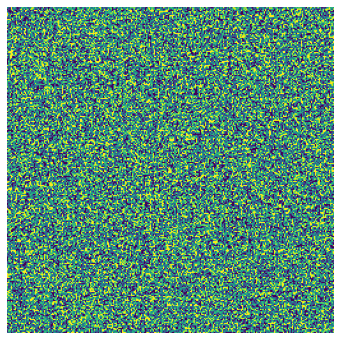

In [2]:
# Initialize rules tensor
beta = viridicle.may_leonard_rules(N, R, DIFFUSION_RATE, empty_zero=ALLOW_EMPTY_SITES)
geo_class = {
    'klein': graphs.KleinGeography,
    'lattice': viridicle.LatticeGeography,
    'sphere': graphs.SphericalGeography,
}[GRAPH]
# Initialize model
geo = geo_class((WIDTH, WIDTH), beta)

# Display system initial state
plot.figure(figsize=(6, 6))
plot.imshow(geo.sites)
plot.axis('off')
plot.show()

We'll now run the model forward for 400 time, capturing the system state every 2.0 time.

In [3]:
counts, record = geo.run(400.0, return_sites=True, report_every=2.0)

Let's plot species abundances over time.

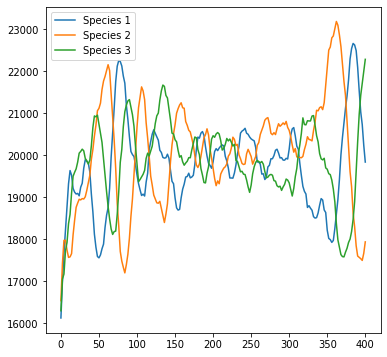

In [4]:
plot.figure(figsize=(6, 6))
for s in range(1, N + 1):
    plot.plot(
        np.arange(0.0, 401.0, 2.0),
        counts[:, s],
        label=f'Species {s}',
    )
plot.legend()
plot.show()

And here's the video:

In [5]:
# Syntax taken from:
# https://stackoverflow.com/questions/51702749/numpy-array-as-video-in-jupyter-notebook

fig = plot.figure(figsize=(6, 6))
im = plot.imshow(record[0, :, :])
plot.axis('off')
plot.close()

def init():
    im.set_data(record[0, :, :])

def animate(i):
    im.set_data(record[i, :, :])
    return im

anim = animation.FuncAnimation(
    fig, animate, init_func=init, frames=record.shape[0],
    interval=50
)
HTML(anim.to_html5_video())

Unfortunately, this video does not render on GitHub. Here, at least is the final system state:

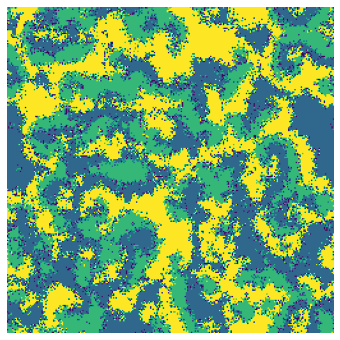

In [6]:
plot.figure(figsize=(6, 6))
plot.imshow(geo.sites)
plot.axis('off')
plot.show()